# Wine Quality Analysis

## Problem:
    The goal is to model the Wine Quality Based on physicochemical test
    Attribute information:
        1. Class
        2. Alcohol
        3. Malic acid 
        4. Ash 
        5. Alcalinity of ash
        6. Magnesium 
        7. Total phenols 
        8. Flavanoids 
        9. Nonflavanoid phenols
        10. Proanthocyanins 
        11. Color intensity 
        12. Hue
        13. diluted wines
        14. Proline 
        
#### We are finding the Quality of the Wine So our target variable is quality        

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
# df = pd.read_csv('winedataset.csv')
df = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/DSData/master/winequality-red.csv")
df.head(20)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


In [3]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [4]:
df.shape

(1599, 12)

# EDA with Pandas Profiling

In [78]:
# import pandas_profiling
# pandas_profiling.ProfileReport(pd.read_csv('winedataset.csv'))

ModuleNotFoundError: No module named 'pandas_profiling'

# Cleansing the Data Using EDA analysis

In [6]:
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

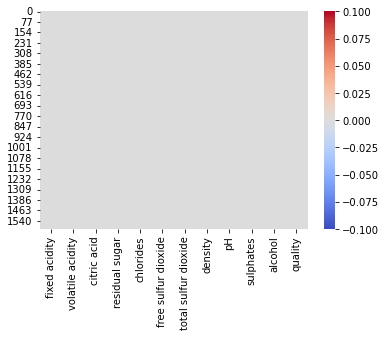

In [7]:
sns.heatmap(df.isna(), cmap = 'coolwarm')
plt.show()

The above plot shows only netural values which means no NAN values

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [9]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


# key observation:
     1. The mean is near to median (50th percentile) in all columns and in Proline, Color and Malic acid intensity mean is larger than median (50th percentile).
     2. There is a large difference in 75th percentile and max in Proline, Malic acid and Color intensity.
     3. The first and second observation suggest that there are outliers and skewness present in these three columns.

In [10]:
df.quality.unique()

array([5, 6, 7, 4, 8, 3])

In [11]:
df.quality.value_counts()  

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64

# key observation:
######                     The Above target variable is splitted into three categories Class 1 Class 2 Class 3


# Correlation With Class variable

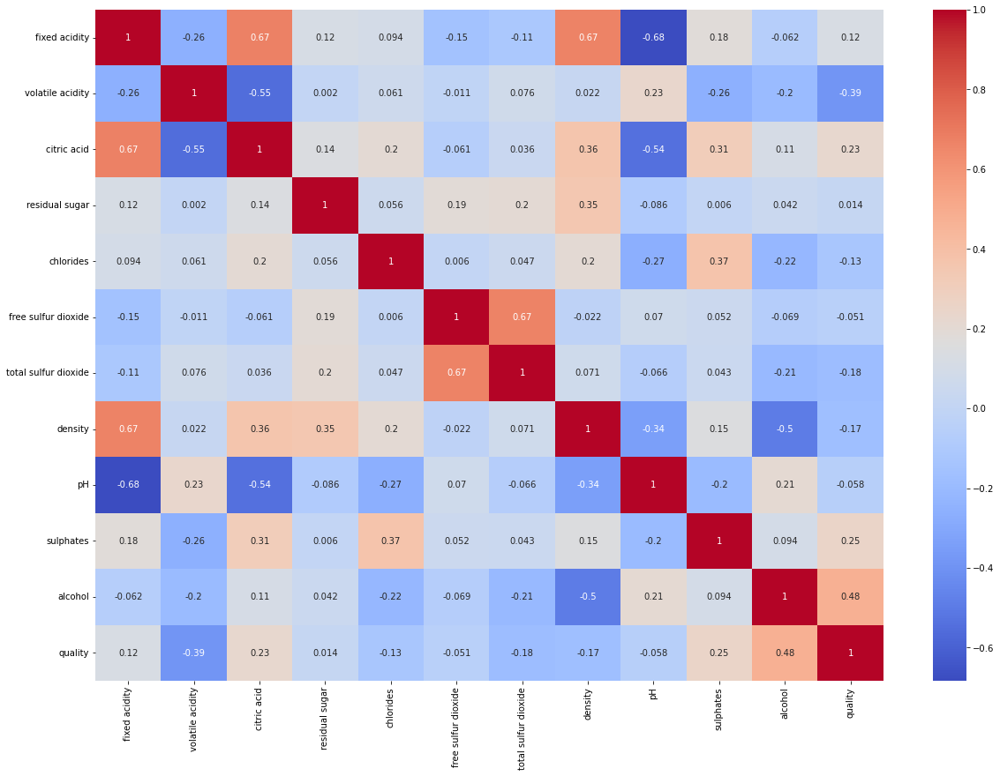

In [12]:
plt.figure(figsize=(20,14))
sns.heatmap(round(df.corr(),3), cmap='coolwarm', annot=True)
plt.show()

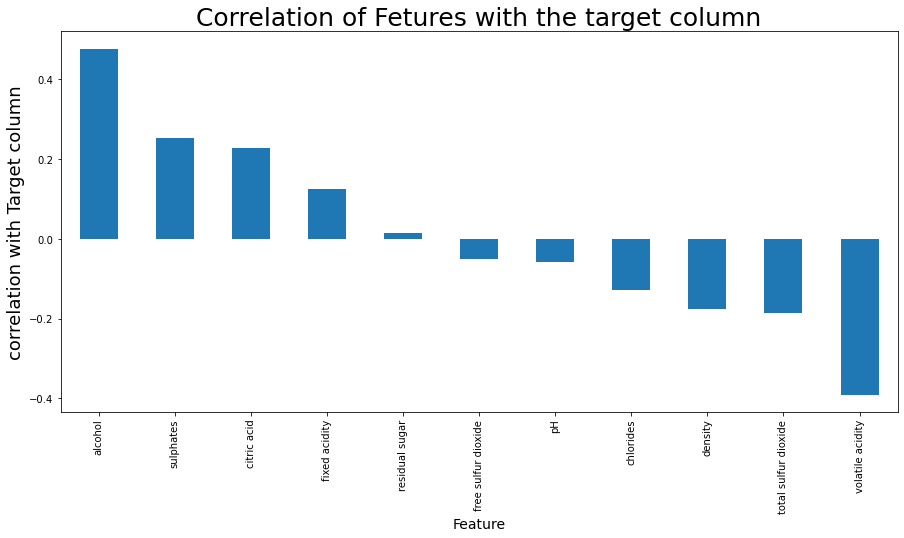

In [13]:
plt.figure(figsize=(15,7))
df.corr()["quality"].sort_values(ascending=False).drop(["quality"]).plot.bar()
plt.xlabel("Feature", fontsize= 14)
plt.ylabel("correlation with Target column", fontsize = 18)
plt.title("Correlation of Fetures with the target column", fontsize=25)
plt.show()

# key observation :

## Positive Correlation with the class:
       1. Alcalinity of ash 0.517859
       2. Nonflavanoid phenols 0.489109
       3. Malic acid 0.437776
       4. Color intensity 0.265668
      
## Negative Correlation with the class:
      1. Hue -0.617369
      2. diluted wines -0.788230	
      3. Proline -0.633717
      4. Alcohol -0.328222
      5. Ash -0.049643
      6. Magnesium -0.209179
      7. Total phenols -0.719163
      8. Flavanoids -0.847498
      9. Proanthocyanins -0.499130

# Unvariate Analysis

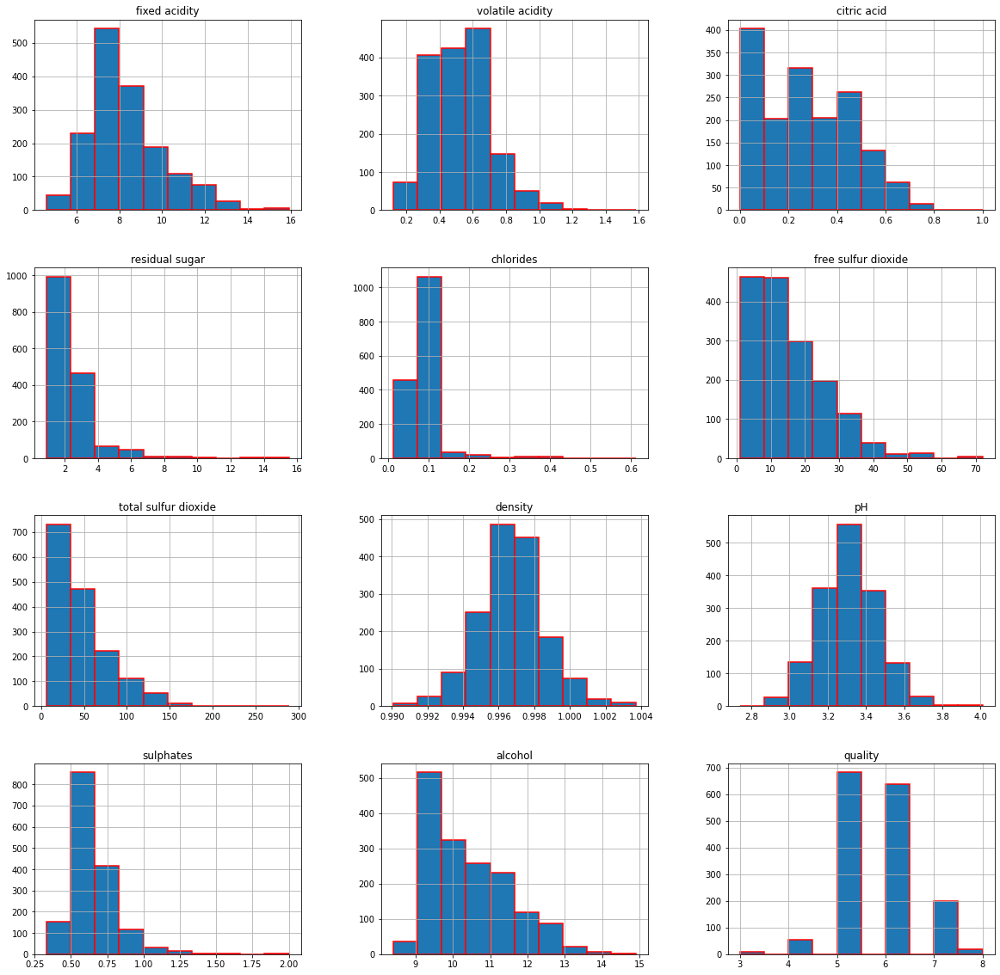

In [14]:
df.hist(edgecolor="red",linewidth= 1.5, figsize= (20,20))
plt.show()

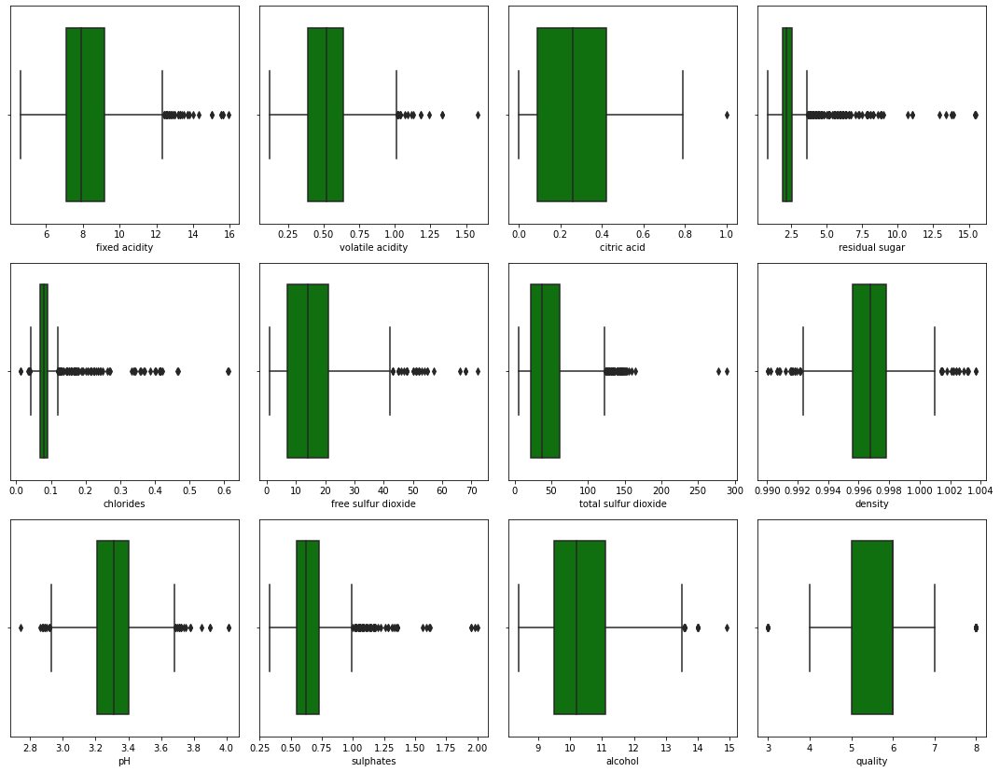

In [15]:
plt.figure(figsize=(15,15))
collist = df.columns.values
for i in range (0, len(collist)):
    plt.subplot(4,4,i+1)
    sns.boxplot(df[collist[i]], color = "green" , orient = "h")
    plt.tight_layout()
    

# Key Observations:
  7 variables have outliers as present in the figure
        1. Malic acid 
        2. Ash 
        3. Alcalinity of ash
        4. Magnesium 
        5. Proanthocyanins 
        6. Color intensity 
        7. Hue

# Removal of outliers

In [16]:
from scipy.stats import zscore
z = np.abs(zscore(df))
threshold = 3
df_new=df[(z<3).all(axis=1)]
df_new

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [17]:
print(f"Orginal Data {df.shape}\nAfter Removing outliers {df_new.shape}\nThe percentage of data loss {((178-168)/178)*100}%")

Orginal Data (1599, 12)
After Removing outliers (1451, 12)
The percentage of data loss 5.617977528089887%


Since the Loss of Data is ~ 5% we are Removing Outliers

BELOW GRAPH WILL SHOW THE SKEWNESS OF THE DATA


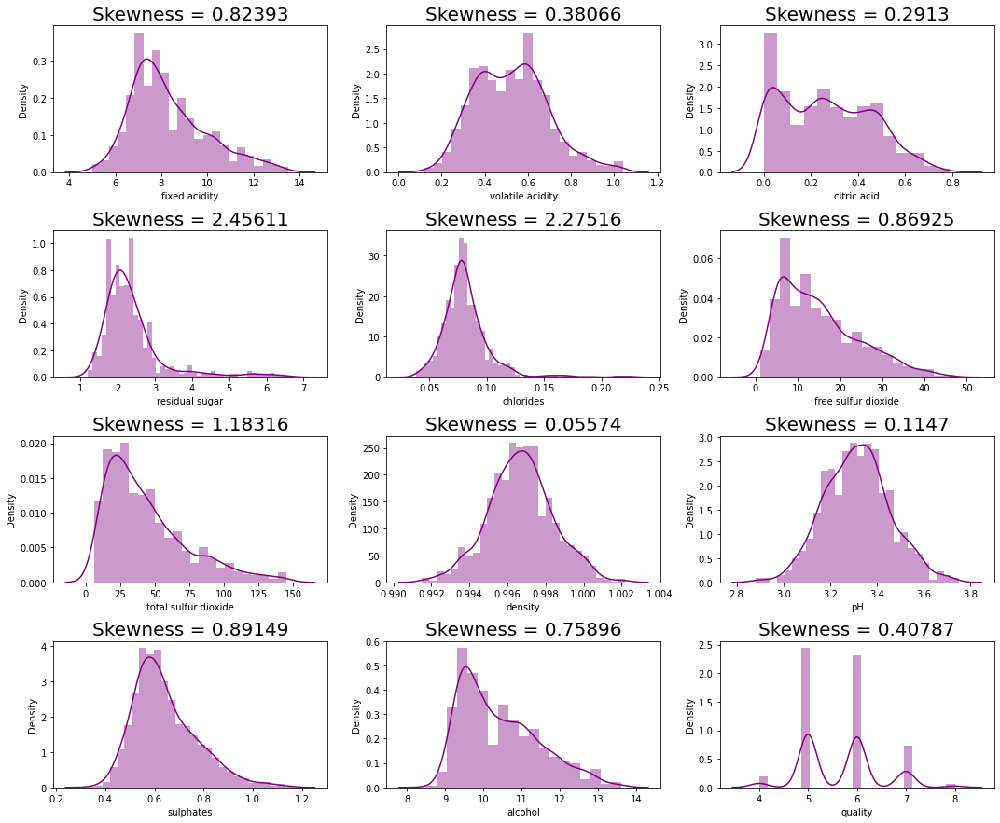

In [18]:
DF= df_new
print("BELOW GRAPH WILL SHOW THE SKEWNESS OF THE DATA")
plt.figure(figsize=(15,15))
for i in range (0, len(collist)):
    plt.subplot(5,3,i+1)
    plt.title(f"Skewness = {round(DF[collist[i]].skew(),5)}",fontsize=20)          
    sns.distplot(DF[collist[i]], color = "purple")
    plt.tight_layout()

# key observation:
    As said before skewness is present in the Proline, Malic Acid and Color Intensity, Megnesium

In [19]:
# from scipy.stats import boxcox

In [20]:
# DF['Color intensity']= boxcox(DF['Color intensity'])[0]
# DF.Magnesium = boxcox(DF.Magnesium)[0]
# DF['Proline    ']= boxcox(DF['Proline    '])[0]
# DF['Malic acid']= boxcox(DF['Malic acid'])[0]

BELOW GRAPH WILL SHOW THE SKEWNESS OF THE DATA


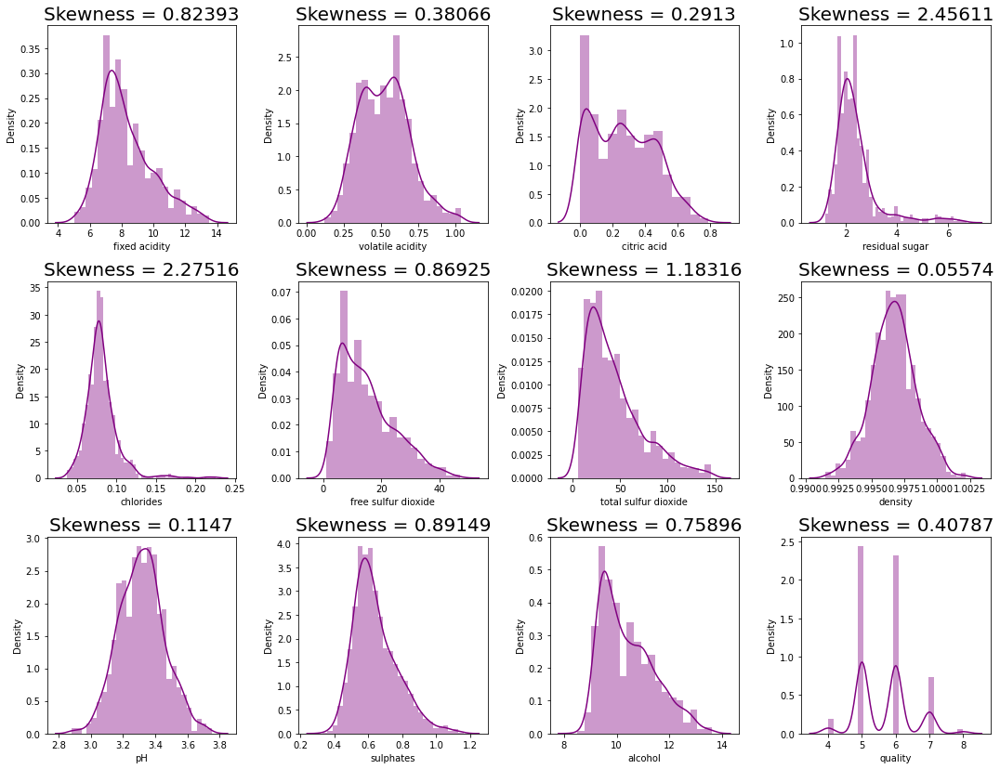

In [21]:
print("BELOW GRAPH WILL SHOW THE SKEWNESS OF THE DATA")
plt.figure(figsize=(15,15))
for i in range (0, len(collist)):
    plt.subplot(4,4,i+1)
    plt.title(f"Skewness = {round(DF[collist[i]].skew(),5)}",fontsize=20)         
    sns.distplot(DF[collist[i]], color = "purple")
    plt.tight_layout()

Skewness is removed but we will check removing of skewed data is affecting the correleration of the data

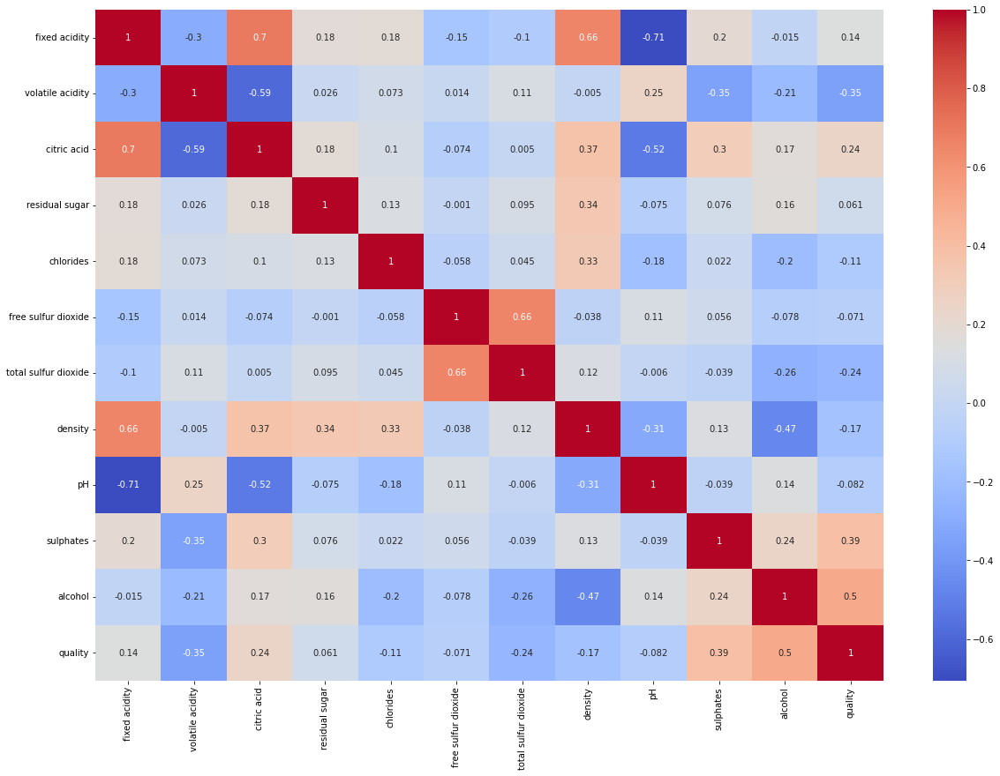

In [22]:
plt.figure(figsize=(20,14))
sns.heatmap(round(DF.corr(),3), cmap='coolwarm', annot=True)
plt.show()

Post the Removal of the Skewness there is not much deference in Colleration

# Multivariate Analysis

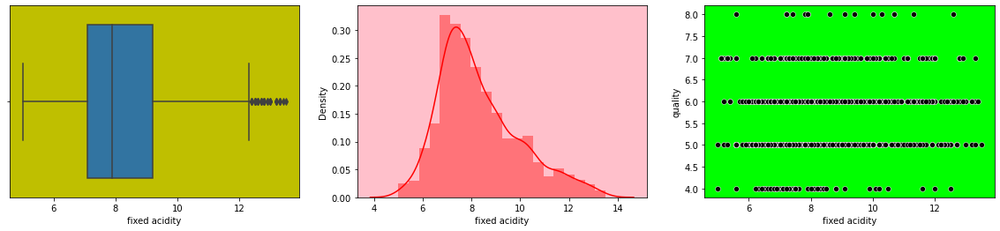

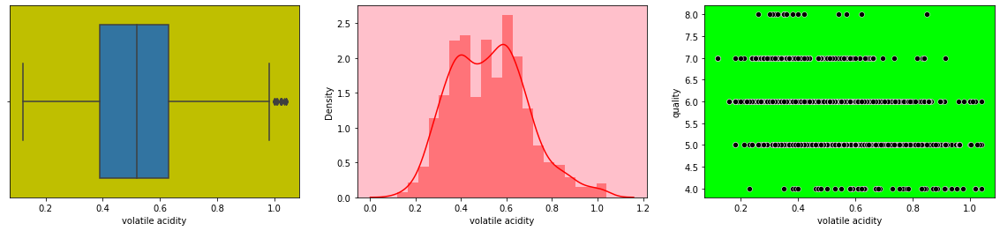

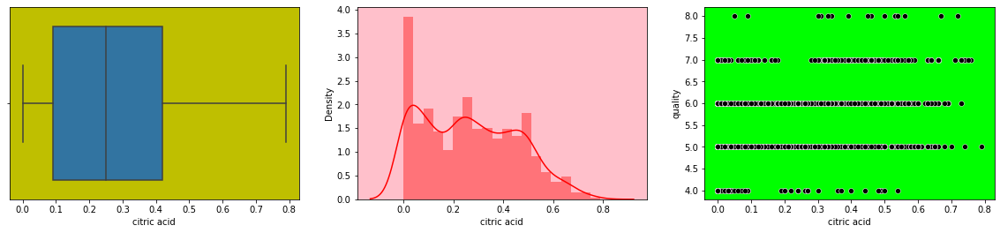

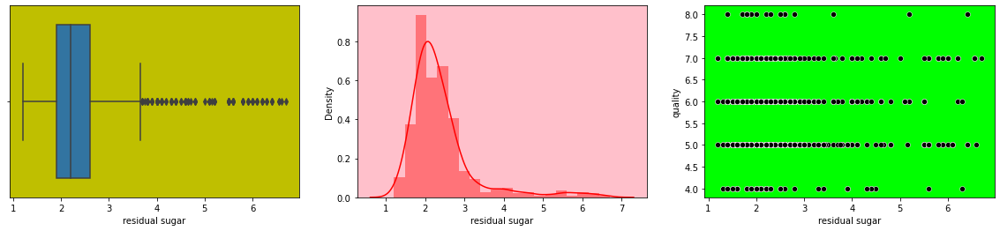

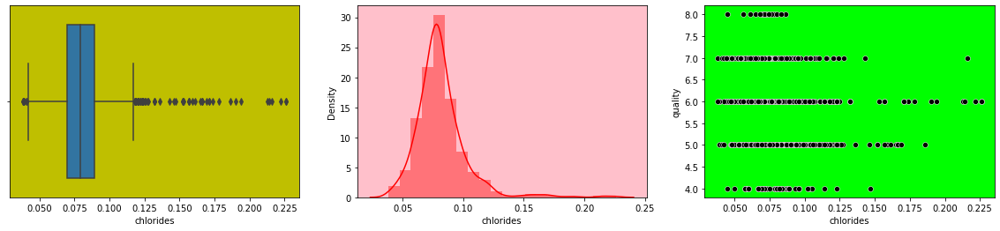

...

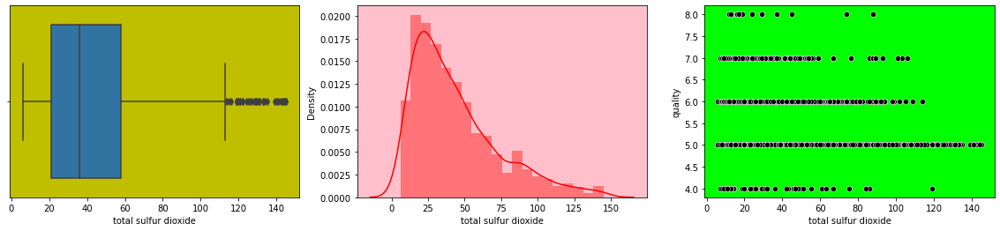

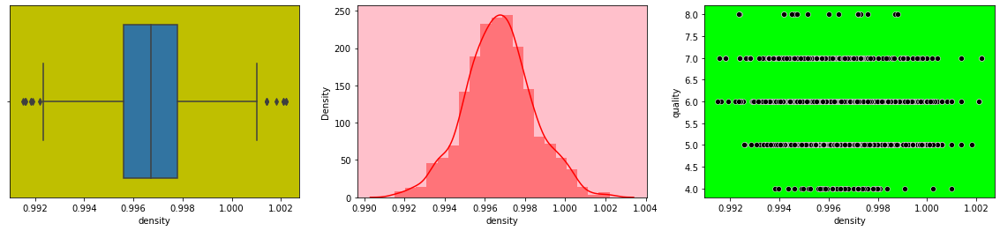

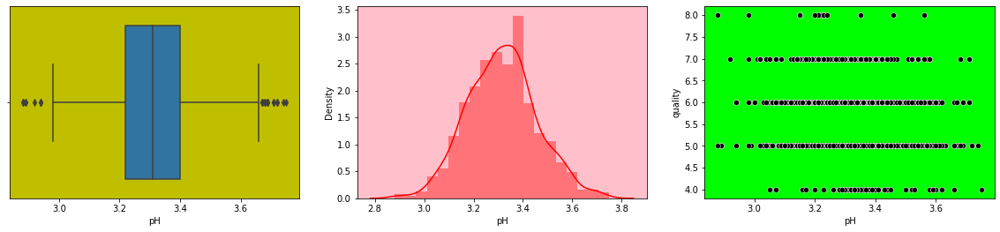

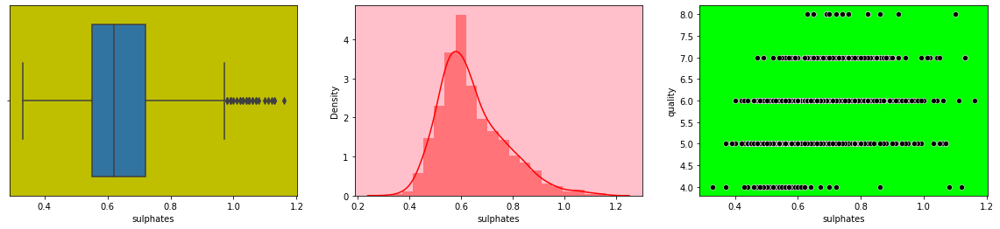

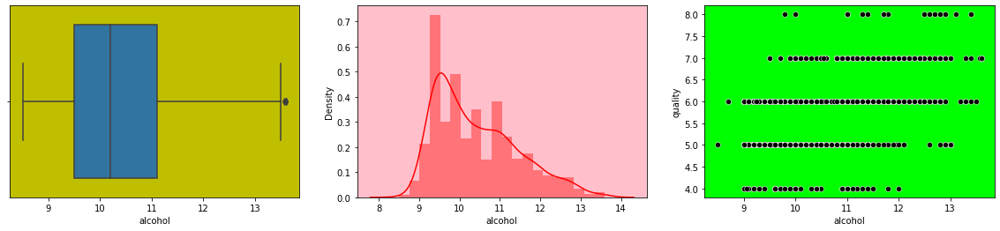

In [23]:
target_variable = "quality"
# target_variable = "Class"
feature_variable = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol']

def num_plots(feature_name):
    fig, axs = plt.subplots(1, 3, figsize=(20, 4))
    a1=sns.boxplot(x=DF[feature_name], ax=axs[0])
    a1.set_facecolor("y")
    a2=sns.distplot(DF[feature_name], bins=20, kde=True, ax=axs[1],color="r")
    a2.set_facecolor("pink")
    a3=sns.scatterplot(data=DF, x=feature_name, y=target_variable, ax=axs[2], color="k")
    a3.set_facecolor("lime")
    plt.show()
    
for i in feature_variable:
    num_plots(i)

In [24]:
import itertools

cols = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol']

length = len(cols)
cs = ["b","r","#003153","#4B0082","m","k","#e61919","#FF00AF","#FF4500","#003153","#E30B5C","#FF2400","#C71585"]

TypeError: unsupported operand type(s) for +: 'NoneType' and 'int'

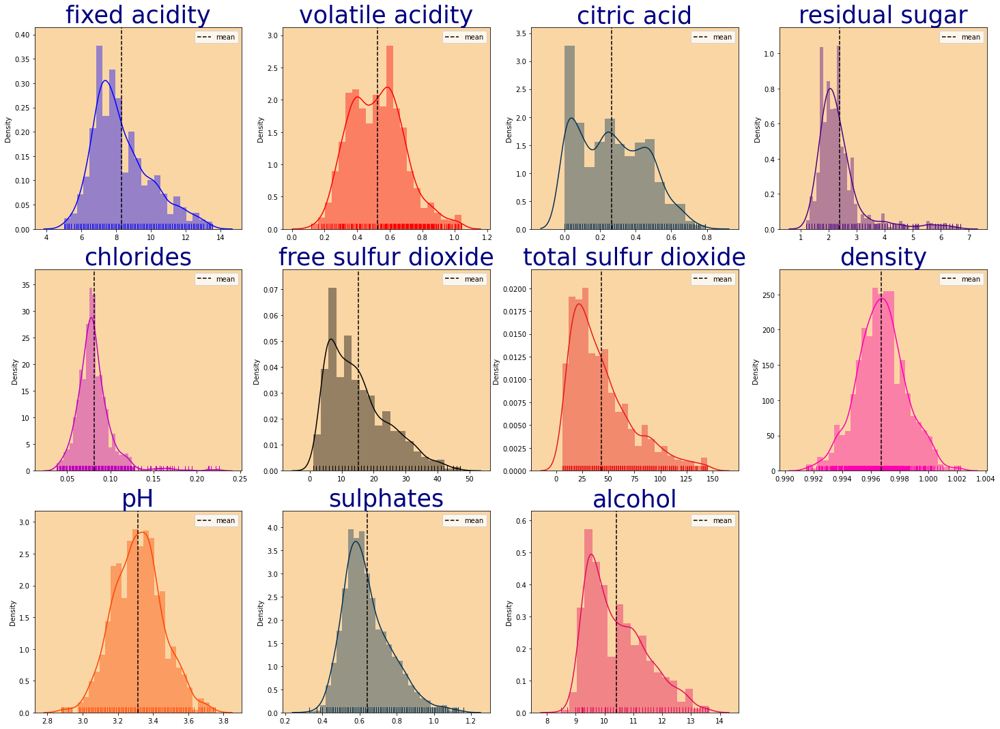

In [25]:
Champagne_Color = "#fad6a5"

plt.figure(figsize=(25,25))
for i,j,k in itertools.zip_longest(cols,range(length),cs):
    plt.subplot(4,4,j+1)
    ax= sns.distplot(DF[i],color=k,rug=True)
    ax.set_facecolor(Champagne_Color)
    plt.axvline(DF[i].mean(), linestyle="dashed", label= "mean", color= "k")
    plt.legend(loc="best")
    plt.title(i,color = "navy", fontsize = 35)
    plt.xlabel("")

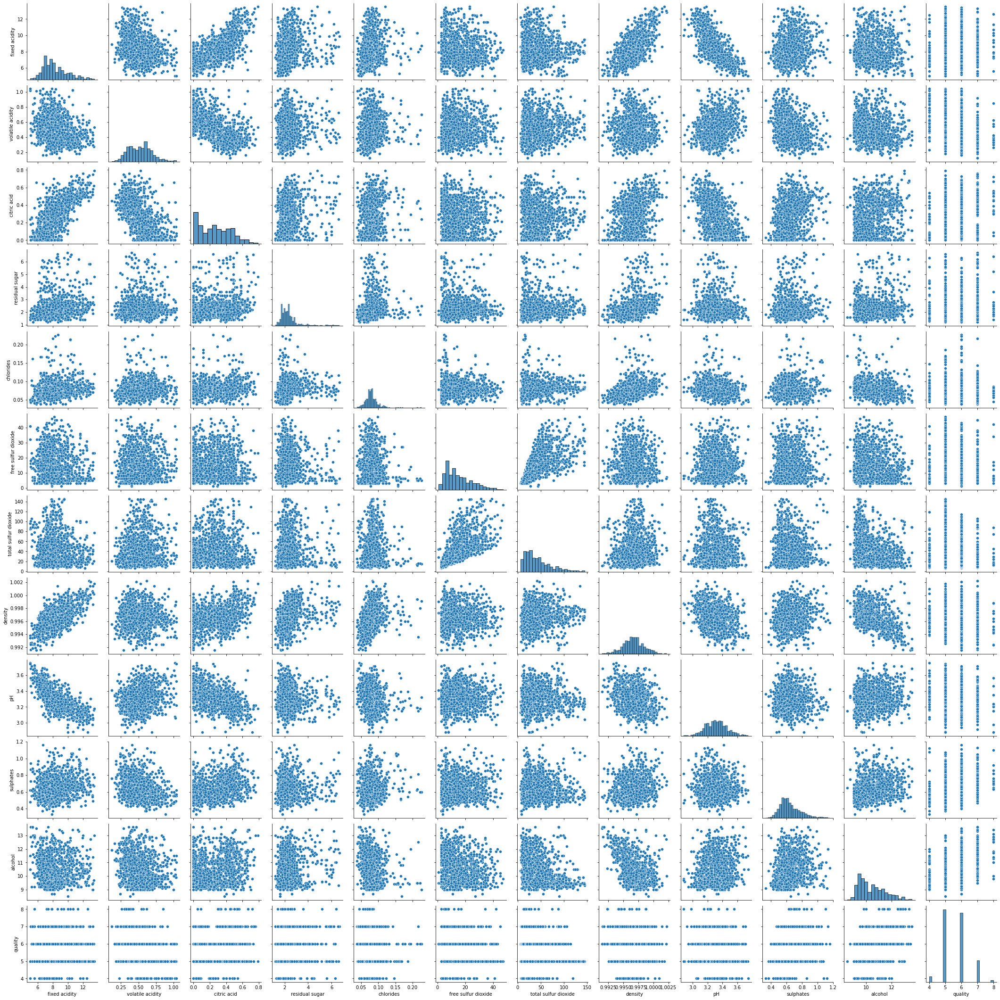

In [26]:
sns.pairplot(DF)
plt.show()

##### Shuffeling the data Since data is following a pattern or sorted by Class Variable

In [27]:
from sklearn.utils import shuffle
DF = shuffle(DF)
DF

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
800,7.2,0.610,0.08,4.0,0.082,26.0,108.0,0.99641,3.25,0.51,9.4,5
975,7.2,0.410,0.30,2.1,0.083,35.0,72.0,0.99700,3.44,0.52,9.4,5
1179,8.2,0.350,0.33,2.4,0.076,11.0,47.0,0.99599,3.27,0.81,11.0,6
1022,7.0,0.510,0.09,2.1,0.062,4.0,9.0,0.99584,3.35,0.54,10.5,5
1386,7.4,0.640,0.07,1.8,0.100,8.0,23.0,0.99610,3.30,0.58,9.6,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1223,10.5,0.360,0.47,2.2,0.074,9.0,23.0,0.99638,3.23,0.76,12.0,6
135,8.4,0.745,0.11,1.9,0.090,16.0,63.0,0.99650,3.19,0.82,9.6,5
997,5.6,0.660,0.00,2.2,0.087,3.0,11.0,0.99378,3.71,0.63,12.8,7
746,8.2,0.340,0.38,2.5,0.080,12.0,57.0,0.99780,3.30,0.47,9.0,6


In [28]:
x=DF.drop(["quality"], axis = 1)
y= DF.quality

In [29]:
from sklearn.preprocessing import MinMaxScaler
scaler= MinMaxScaler(feature_range=(1,3)) 
# Since the Class Target variaable has three class we are splitting the feature variable into 3 

In [30]:
X=scaler.fit_transform(x)

# Selecting Parameter for Training 

In [31]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

In [32]:
accu = 0
for i in range(0,20000):
    x_train, x_test, y_train, y_test = train_test_split(X,y,test_size = .25, random_state = i)
    mod = GaussianNB()
    mod.fit(x_train,y_train)
    y_pred = mod.predict(x_test)
    acc = accuracy_score(y_test,y_pred)
    if acc> accu:
        accu= acc
        best_rstate=i

print(f"Best Accuracy {accu*100} found on randomstate {best_rstate}")

Best Accuracy 66.66666666666666 found on randomstate 4860


In [33]:
x_train, x_test, y_train, y_test = train_test_split(X,y,test_size = .25, random_state = best_rstate)

# Selecting the Best model for Training

In [34]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import RandomizedSearchCV, cross_val_score 
from sklearn.model_selection import cross_validate, cross_val_predict, StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.linear_model import SGDClassifier
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn import metrics
import xgboost as xgb

import warnings
warnings.filterwarnings('ignore')

# Baseline
             
             
             First, we are going to train a dummy classifier that we will use as a baseline with which to compare.

In [35]:
clf_dummy = DummyClassifier(strategy="uniform", random_state=42) # Random prediction
clf_dummy.fit(x_train, y_train)

DummyClassifier(random_state=42, strategy='uniform')

In [36]:
cross_val_score(clf_dummy, x_train, y_train, cv=5, scoring="accuracy", n_jobs=-1).mean()

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 a

0.19025916374244284

In [37]:
clf_dummy = DummyClassifier(strategy="most_frequent", random_state=42) 
clf_dummy.fit(x_train, y_train)

DummyClassifier(random_state=42, strategy='most_frequent')

In [38]:
cross_val_score(clf_dummy, x_train, y_train, cv=5, 
                scoring="accuracy", n_jobs=-1).mean()

0.43290491692385746

In [39]:
preds = cross_val_predict(clf_dummy, x_train, y_train, cv=5, n_jobs=-1)
conf_mx = metrics.confusion_matrix(y_train, preds)
conf_mx

array([[  0,  35,   0,   0,   0],
       [  0, 471,   0,   0,   0],
       [  0, 429,   0,   0,   0],
       [  0, 143,   0,   0,   0],
       [  0,  10,   0,   0,   0]])

In [40]:
pd.crosstab(y_train, preds, rownames = ['Real'], colnames =['Predicted'])

Predicted,5
Real,
4,35
5,471
6,429
7,143
8,10


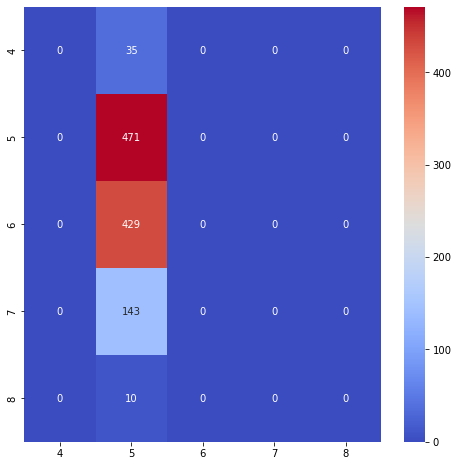

In [41]:
fig = plt.figure(figsize=(8,8))
ax = sns.heatmap(conf_mx, annot=True, fmt="d", 
                 xticklabels=clf_dummy.classes_,
                 yticklabels=clf_dummy.classes_,cmap = "coolwarm")

In [42]:
accuracy_base = metrics.accuracy_score(y_train, preds)
precision_base = metrics.precision_score(y_train, preds, average='weighted', 
                                         zero_division=0)
recall_base = metrics.recall_score(y_train, preds, average='weighted')
f1_base = metrics.f1_score(y_train, preds, average='weighted')
print(f"Accuracy: {accuracy_base}")
print(f"Precision: {precision_base}")
print(f"Recall: {recall_base}")
print(f"f1: {f1_base}")

Accuracy: 0.4329044117647059
Precision: 0.18740622972534604
Recall: 0.4329044117647059
f1: 0.2615753405274875


In [43]:
print(metrics.classification_report(y_train, preds, zero_division=0))

              precision    recall  f1-score   support

           4       0.00      0.00      0.00        35
           5       0.43      1.00      0.60       471
           6       0.00      0.00      0.00       429
           7       0.00      0.00      0.00       143
           8       0.00      0.00      0.00        10

    accuracy                           0.43      1088
   macro avg       0.09      0.20      0.12      1088
weighted avg       0.19      0.43      0.26      1088



# Shortlisting Promissing Models

In [44]:
def evaluate_model(estimator, x_train, y_train, cv=5, verbose=True):
   
    scoring = {"accuracy": "accuracy",
               "precision": "precision_weighted",
               "recall": "recall_weighted",
               "f1": "f1_weighted"}
    scores = cross_validate(estimator, x_train, y_train, cv=cv, scoring=scoring)
    
    accuracy, accuracy_std = scores['test_accuracy'].mean(), \
                                scores['test_accuracy'].std()
    
    precision, precision_std = scores['test_precision'].mean(), \
                                scores['test_precision'].std()
    
    recall, recall_std = scores['test_recall'].mean(), \
                                scores['test_recall'].std()
    
    f1, f1_std = scores['test_f1'].mean(), scores['test_f1'].std()

    
    result = {
        "Accuracy": accuracy,
        "Accuracy std": accuracy_std,
        "Precision": precision,
        "Precision std": precision_std,
        "Recall": recall,
        "Recall std": recall_std,
        "f1": f1,
        "f1 std": f1_std,
    }
    
    if verbose:
        print(f"Accuracy: {accuracy} - (std: {accuracy_std})")
        print(f"Precision: {precision} - (std: {precision_std})")
        print(f"Recall: {recall} - (std: {recall_std})")
        print(f"f1: {f1} - (std: {f1_std})")

    return result

In [45]:
models = [GaussianNB(), KNeighborsClassifier(), RandomForestClassifier(random_state=42),
          DecisionTreeClassifier(random_state=42), ExtraTreeClassifier(random_state=42), 
          AdaBoostClassifier(random_state=42), GradientBoostingClassifier(random_state=42), 
          xgb.XGBClassifier()]

model_names = ["Naive Bayes Gaussian", "K Neighbors Classifier", "Random Forest",
               "Decision Tree", "Extra Tree", "Ada Boost", 
               "Gradient Boosting", "XGBoost"]

In [46]:
accuracy = []
precision = []
recall = []
f1 = []

for model in range(len(models)):
    print(f"\n\nStep {model+1} of {len(models)}")
    print(f".........................running {model_names[model]}")
    
    clf_scores = evaluate_model(models[model], x_train, y_train)
    
    accuracy.append(clf_scores["Accuracy"])
    precision.append(clf_scores["Precision"])
    recall.append(clf_scores["Recall"])
    f1.append(clf_scores["f1"])



Step 1 of 8
.........................running Naive Bayes Gaussian
Accuracy: 0.5496173846869319 - (std: 0.023659060393435478)
Precision: 0.5592362780960993 - (std: 0.024610266462067914)
Recall: 0.5496173846869319 - (std: 0.023659060393435478)
f1: 0.5515891292738516 - (std: 0.023271689925244376)


Step 2 of 8
.........................running K Neighbors Classifier
Accuracy: 0.5634338138925296 - (std: 0.014928795676634571)
Precision: 0.5412133961535451 - (std: 0.01727889399500469)
Recall: 0.5634338138925296 - (std: 0.014928795676634571)
f1: 0.5484598397966748 - (std: 0.01701270247315071)


Step 3 of 8
.........................running Random Forest
Accuracy: 0.6728195154948632 - (std: 0.01775493384457005)
Precision: 0.645049205125827 - (std: 0.014273468993475525)
Recall: 0.6728195154948632 - (std: 0.01775493384457005)
f1: 0.6543643113172177 - (std: 0.015992268792191823)


Step 4 of 8
.........................running Decision Tree
Accuracy: 0.6065869022956919 - (std: 0.018494300912669712)

In [47]:
df_result = pd.DataFrame({"Model": model_names,
                          "accuracy": accuracy,
                          "precision": precision,
                          "recall": recall,
                          "f1": f1})
df_result.sort_values(by="f1", ascending=False)

,Model,accuracy,precision,recall,f1
2,Random Forest,0.672820,0.645049,0.672820,0.654364
7,XGBoost,0.653494,0.637099,0.653494,0.639429
6,Gradient Boosting,0.635099,0.620723,0.635099,0.622674
3,Decision Tree,0.606587,0.603412,0.606587,0.603567
4,Extra Tree,0.589168,0.587129,0.589168,0.587088
0,Naive Bayes Gaussian,0.549617,0.559236,0.549617,0.551589
1,K Neighbors Classifier,0.563434,0.541213,0.563434,0.548460
5,Ada Boost,0.403496,0.483072,0.403496,0.426327


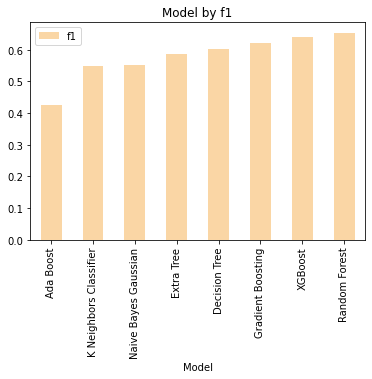

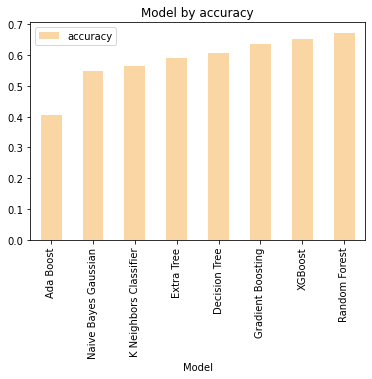

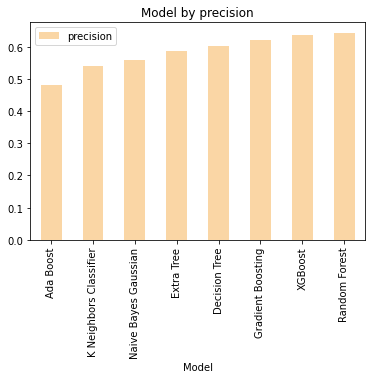

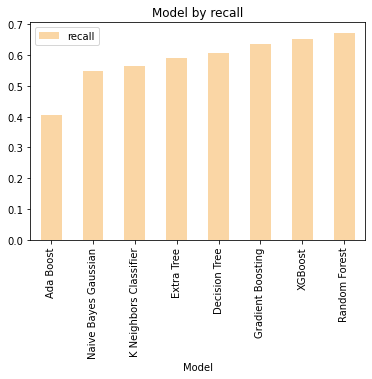

In [48]:
metrics_list = ["f1", "accuracy", "precision", "recall"]

for metric in metrics_list:
    df_result.sort_values(by=metric).plot.bar("Model", metric, color = Champagne_Color)
    plt.title(f"Model by {metric}")
    plt.show()

# THE ABOVE OBSEVATION SHOWS THAT:
    RANDOMFOREST and NAIVE BAYES GAUSSIAN performs well and tops the chart as
    Accuracy: 0.992
    Precision: 0.993
    Recall: 0.992
    f1: 0.9920561403508771

In [49]:
clf_rf = RandomForestClassifier(random_state=42)
preds = cross_val_predict(clf_rf, x_train, y_train, cv=5, n_jobs=-1)

In [50]:
clf_rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

In [51]:
pd.crosstab(y_train, preds, rownames = ['Real'], colnames =['Predicted'])

Predicted,4,5,6,7
Real,,,,
4,0,27,7,1
5,0,376,91,4
6,1,113,288,27
7,0,9,66,68
8,0,0,6,4


In [52]:
print(metrics.classification_report(y_train, preds, zero_division=0))

              precision    recall  f1-score   support

           4       0.00      0.00      0.00        35
           5       0.72      0.80      0.76       471
           6       0.63      0.67      0.65       429
           7       0.65      0.48      0.55       143
           8       0.00      0.00      0.00        10

    accuracy                           0.67      1088
   macro avg       0.40      0.39      0.39      1088
weighted avg       0.64      0.67      0.66      1088



# HYPER TUNING....

In [53]:
param_grid = [
    {"n_estimators": range(20, 200, 20), 
     "bootstrap": [True, False],
     "criterion": ["gini", "entropy"],   
     "max_depth": [2, 4, 6, 8, 10, 12, 14, None],
     "max_features": ["auto", "sqrt", "log2"], 
     "min_samples_split": [2, 5, 10],
     "min_samples_leaf": [1, 2, 4],
     }
]

clf_rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [54]:
clf_random = RandomizedSearchCV(clf_rf, param_grid, n_iter = 200, cv = 5, 
                                scoring="f1_weighted", verbose=2, 
                                random_state=42, n_jobs = -1)

In [55]:
clf_random.fit(x_train, y_train)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=180; total time=   1.0s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=120; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=120; total time=   0.8s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, mi

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=180; total time=   1.0s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=120; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=sqrt,

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=180; total time=   0.9s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=180; total time=   1.2s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=120; total time=   0.7s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=120; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=120; total time=   0.9s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=80; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=auto, min_sample

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=120; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=120; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=180; total time=   1.2s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_sample

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   n_iter=200, n_jobs=-1,
                   param_distributions=[{'bootstrap': [True, False],
                                         'criterion': ['gini', 'entropy'],
                                         'max_depth': [2, 4, 6, 8, 10, 12, 14,
                                                       None],
                                         'max_features': ['auto', 'sqrt',
                                                          'log2'],
                                         'min_samples_leaf': [1, 2, 4],
                                         'min_samples_split': [2, 5, 10],
                                         'n_estimators': range(20, 200, 20)}],
                   random_state=42, scoring='f1_weighted', verbose=2)

In [56]:
clf_random.best_params_

{'n_estimators': 160,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 12,
 'criterion': 'entropy',
 'bootstrap': False}

In [57]:
preds = cross_val_predict(clf_random.best_estimator_, x_train, y_train, cv=5, n_jobs=-1)
print(metrics.classification_report(y_train, preds, zero_division=0))

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

              precision    recall  f1-score   support

           4       0.00      0.00      0.00        35
           5       0.72      0.82      0.77       471
           6       0.65      0.67      0.66       429
           7       0.64      0.49      0.56       143
           8       0.00      0.00      0.00        10

    accuracy                           0.68      1088
   macro avg       0.40      0.40      0.40      1088
weighted avg       0.65      0.68      0.67      1088



# Final fine-tune with GridSearch


In [58]:
param_grid = [
    {"n_estimators": range(20, 100, 10), 
     "bootstrap": [True, False],
     "criterion": ["gini", "entropy"],   
     "max_depth": [2, 4, 6, 8, 10, 12, 14, None],
     "max_features": ["auto", "sqrt", "log2"], 
     "min_samples_split": [2, 5, 10],
     "min_samples_leaf": [1, 2, 4],
     }
]


clf_rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [59]:
grid_search = GridSearchCV(clf_rf, param_grid, cv=5,
                           scoring="f1_weighted", verbose=2, n_jobs=-1)

In [60]:
grid_search.fit(x_train, y_train)

Fitting 5 folds for each of 6912 candidates, totalling 34560 fits


/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=180; total time=   0.9s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=120; total time=   0.7s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=120; total time=   0.7s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=160; total time=   0.9s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, mi

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=120; total time=   0.7s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=180; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=180; total time=   1.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=180; total time=   0.9s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=auto, min_

[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=4, min_sam

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=70; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_sam

[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_sam

[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   0.7s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_sam

[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_sam

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, m

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

in_samples_split=10, n_estimators=90; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, m

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=30; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, m

[CV] END bootstrap=True, criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_sam

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_s

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=30; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_s

[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=40; total time=  -0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=70; total time=   0.8s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, m

[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=40; total time=  -0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min

[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.8s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   1.0s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   1.1s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_sam

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.7s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, m

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_sam

[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=40; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=auto, min_samples_le

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.8s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, m

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.7s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=70; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.8s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.8s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.8s
[CV] END bootstrap=True, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_sam

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=90; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=70; total time=   0.7s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.8s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   1.0s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.9s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=30; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4

[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   1.0s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   0.8s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=70; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=12, max_features=log2, min_samples_le

[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=70; total time=   0.7s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=70; total time=   0.8s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, 

[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, 

[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.8s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_le

[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_le

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.8s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.9s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=

[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=40; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=sqrt, min_sa

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_le

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=70; total time=   0.9s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=80; total time=   0.7s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=90; total time=   0.7s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_s

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=sqrt, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=90; total time=   0.8s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=log2, min_sa

[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=70; total time=   0.7s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=80; total time=   0.9s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=90; total time=   1.0s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min

[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=70; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=70; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=80; total time=   0.8s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=90; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_s

[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=90; total time=   0.9s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=2, max_features=auto, mi

[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=70; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=80; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=90; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, mi

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=log2, min_sa

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=auto, m

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=60; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=sqrt, min_sa

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=sqrt, min_sa

[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=6, max_features=log2, min_s

[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=4, max_features=log2, min_sa

[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_sa

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=sqrt, m

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=auto,

[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_s

[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=70; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_sa

[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=8, max_features=auto, min_sa

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=80; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2,

[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.8s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=au

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features

 keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascienc

epth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=90; total time=   0.8s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=40; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n

ep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_e

, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=ent

  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

ropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_spl

estClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 an

it=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=70; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=80; total time=   1.0s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=90; total time=   0.9s
[CV] END bootstrap=True, cr

d will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/o

iterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=90; total time=   0.9s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=30; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=40; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_s

set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/skl

[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=60; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2,

n/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

ntropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   0.9s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_spl

nsemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the de

it=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=40; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion

rameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning

   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=90; total time=   0.9s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_feat

eprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  wa

py, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2

rn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past beh

ors=20; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.9s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy,

for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been depreca

ap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=80; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=90; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_

[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.8s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.9s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   0.8s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=12, max_features=log2,

[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=60; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2,

[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   1.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=40; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto,

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.8s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.8s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=

st.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value f

sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=80; total time=   1.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time= 

packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as

criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=70; total time=   0.8s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=80; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time=   0.9s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

samples_split=2, n_estimators=90; total time=   0.9s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.4s


/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=70; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=70; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=80; total time=   0.8s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=90; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=log2

[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_

[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=30; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=40; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=40; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto,

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=30; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.9s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.8s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt,

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=90; total time=   0.8s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=14, max_features=sqrt

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=auto, min_samples_leaf=1, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=70; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=70; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=80; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=sqrt, min_samples_le

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=2, max_features=log2, min_samples_leaf=2, 

[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.7s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, 

[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.5s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.6s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.8s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.8s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=None,

[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.1s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.4s
[CV] END bootstrap=True, criterion=entropy, max_depth=None, max_

[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=70; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=70; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.6s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=90; total time=   0.8s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=sqrt, min_samples_lea

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   0.6s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=70; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=80; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=80; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=80; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time=   0.6s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, 

[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=70; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=70; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=80; total time=   0.6s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=70; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=sqrt, min_samples_le

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=70; total time=   0.6s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=auto, min_samples_l

[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=60; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, 

[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=90; total time=   0.6s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_lea

[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, 

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_sam

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=60; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=70; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_l

[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.6s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.7s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.7s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=auto, min_sampl

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=30; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=60; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=70; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=sqrt, min_samples_l

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=90; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=70; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=90; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=sqrt, min_sam

[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=10, max_features=log2, min_samples_l

[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=90; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_sampl

[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=sqrt, min_samples

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.6s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=log2, min_sam

[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time=   0.7s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time=   0.9s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=auto,

[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=70; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=80; total time=   0.6s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_sam

[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.6s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=gini, max_depth=14, max_features=auto, min_sampl

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=70; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.6s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2,

[CV] END bootstrap=False, criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=2, max_features=sqrt,

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=90; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=2, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=2, max_features=

[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   0.7s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2,

[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=90; total time=   0.8s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=30; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.5s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2

[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=30; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=40; total time=   0.6s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.7s
[CV] END bootstrap=False, criterion=gini, max_depth=None, max_features

[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=80; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time=   0.7s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto,

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.7s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=70; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=log2,

[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=sqrt,

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=30; total time=   0.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto,

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=90; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqr

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=4, max_features

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=70; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=80; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log

[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time=   1.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=auto,

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log

[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.7s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features=l

[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=80; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features

[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=70; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=90; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=8, max_features

[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   0.8s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=30; total time=   0.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_feature

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_f

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_feature

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=70; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=20; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_feature

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_feature

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=40; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.7s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_f

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=90; total time=   0.7s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=30; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=10, max_featur

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=80; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=90; total time=   0.7s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=30; total time=   0.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_feat

[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=70; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=80; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=90; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_feature

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=60; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=90; total time=   0.7s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_feature

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behavio

[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=70; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=80; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=90; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=90; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=30; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=40; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=None, m

[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.1s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=40; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=12, max_f

[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.7s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_feature

[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=70; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=80; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=80; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=90; total time=   1.0s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=30; total time=   0.2s
[CV] END bootstrap=False, criterion=entropy, max_depth=14, max_feature

[CV] END bootstrap=False, criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.4s
[CV] END bootstrap=False, criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=70; total time=   0.6s
[CV] END bootstrap=False, criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.5s
[CV] END bootstrap=False, criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=80; total time=   0.7s
[CV] END bootstrap=False, criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=90; total time=   0.7s
[CV] END bootstrap=False, criterion=entropy, max_depth=Non

GridSearchCV(cv=5, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid=[{'bootstrap': [True, False],
                          'criterion': ['gini', 'entropy'],
                          'max_depth': [2, 4, 6, 8, 10, 12, 14, None],
                          'max_features': ['auto', 'sqrt', 'log2'],
                          'min_samples_leaf': [1, 2, 4],
                          'min_samples_split': [2, 5, 10],
                          'n_estimators': range(20, 100, 10)}],
             scoring='f1_weighted', verbose=2)

In [61]:
grid_search.best_params_

{'bootstrap': False,
 'criterion': 'entropy',
 'max_depth': 12,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 50}

In [62]:
final_model = grid_search.best_estimator_
preds = cross_val_predict(final_model, x_train, y_train, cv=5, n_jobs=-1)
preds

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 a

array([5, 5, 5, ..., 6, 5, 5])

/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/aditya/opt/anaconda3/envs/datascience_env/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


In [63]:
pd.crosstab(y_train, preds, rownames = ['Actual'], colnames =['Predicted'])

Predicted,4,5,6,7,8
Actual,,,,,
4,1,24,9,1,0
5,1,384,82,4,0
6,0,111,290,27,1
7,0,10,62,71,0
8,0,0,4,6,0


In [64]:
print(metrics.classification_report(y_train, preds))

              precision    recall  f1-score   support

           4       0.50      0.03      0.05        35
           5       0.73      0.82      0.77       471
           6       0.65      0.68      0.66       429
           7       0.65      0.50      0.56       143
           8       0.00      0.00      0.00        10

    accuracy                           0.69      1088
   macro avg       0.51      0.40      0.41      1088
weighted avg       0.67      0.69      0.67      1088



In [65]:
y_pred = final_model.predict(x_test)

pd.crosstab(y_test, y_pred, rownames = ['Actual'], colnames =['Predicted'])

Predicted,4,5,6,7,8
Actual,,,,,
4,0,6,6,0,0
5,0,120,25,1,0
6,1,42,105,9,0
7,0,4,11,27,0
8,0,0,3,2,1


In [66]:
print(metrics.classification_report(y_test, y_pred, zero_division=0))

              precision    recall  f1-score   support

           4       0.00      0.00      0.00        12
           5       0.70      0.82      0.75       146
           6       0.70      0.67      0.68       157
           7       0.69      0.64      0.67        42
           8       1.00      0.17      0.29         6

    accuracy                           0.70       363
   macro avg       0.62      0.46      0.48       363
weighted avg       0.68      0.70      0.68       363



In [67]:
conf_mx = metrics.confusion_matrix(y_test, y_pred)

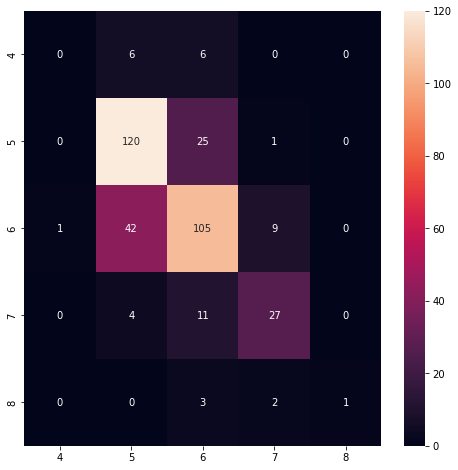

In [68]:
fig = plt.figure(figsize=(8,8))
ax = sns.heatmap(conf_mx, annot=True, fmt="d", 
                 xticklabels=final_model.classes_,
                 yticklabels=final_model.classes_,)

In [69]:
feature_importances = final_model.feature_importances_
feature_importances

array([0.06876536, 0.09160154, 0.08317151, 0.06476638, 0.07934424,
       0.06062879, 0.09926289, 0.09271213, 0.07045916, 0.12311982,
       0.1661682 ])

In [70]:
selector = RFECV(final_model, step=1, cv=StratifiedKFold())
selector = selector.fit(x_train, y_train)

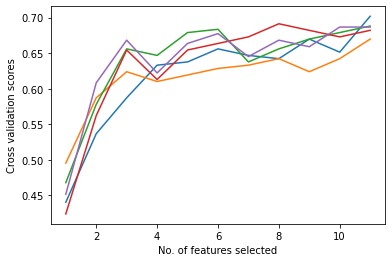

In [71]:
plt.figure()
plt.xlabel("No. of features selected")
plt.ylabel("Cross validation scores")
plt.plot(range(1, len(selector.grid_scores_) + 1), selector.grid_scores_)
plt.show()

In [72]:
selector.grid_scores_

array([[0.44036697, 0.49541284, 0.46788991, 0.42396313, 0.4516129 ],
       [0.53669725, 0.58715596, 0.57798165, 0.56221198, 0.60829493],
       [0.58715596, 0.62385321, 0.6559633 , 0.65437788, 0.66820276],
       [0.63302752, 0.61009174, 0.64678899, 0.61290323, 0.62211982],
       [0.63761468, 0.61926606, 0.67889908, 0.65437788, 0.66359447],
       [0.6559633 , 0.62844037, 0.68348624, 0.66359447, 0.67741935],
       [0.64678899, 0.63302752, 0.63761468, 0.67281106, 0.64516129],
       [0.64220183, 0.64220183, 0.6559633 , 0.69124424, 0.66820276],
       [0.66972477, 0.62385321, 0.66972477, 0.68202765, 0.65898618],
       [0.65137615, 0.64220183, 0.67889908, 0.67281106, 0.68663594],
       [0.70183486, 0.66972477, 0.68807339, 0.68202765, 0.68663594]])

# Saving the final model

In [73]:
import joblib

In [74]:
joblib.dump(final_model,"Wine_Quaity.obj")

['Wine_Quaity.obj']

In [75]:
Wine_mod = joblib.load("Wine_Quaity.obj")
prediction = Wine_mod.predict(x_test)
prediction

array([5, 6, 6, 5, 5, 5, 5, 7, 6, 5, 5, 5, 7, 6, 5, 5, 6, 5, 5, 5, 6, 5,
       5, 5, 5, 5, 5, 6, 6, 6, 5, 5, 5, 6, 7, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 5, 5, 6, 6, 5, 6, 5, 6, 6, 5, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6, 6,
       6, 5, 7, 6, 6, 5, 6, 5, 6, 5, 6, 6, 5, 7, 5, 5, 5, 6, 6, 6, 5, 7,
       5, 5, 6, 6, 6, 5, 5, 5, 5, 5, 5, 6, 6, 7, 6, 5, 6, 6, 5, 5, 5, 5,
       6, 6, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 7, 5, 5, 5, 6, 5,
       5, 5, 5, 7, 5, 7, 5, 5, 5, 4, 5, 5, 6, 5, 6, 6, 5, 6, 5, 5, 7, 6,
       6, 7, 5, 5, 5, 5, 7, 6, 6, 6, 5, 5, 5, 6, 6, 5, 5, 7, 5, 5, 5, 6,
       6, 5, 5, 6, 7, 6, 6, 6, 6, 6, 6, 5, 5, 5, 7, 7, 6, 5, 6, 5, 5, 6,
       8, 7, 6, 5, 5, 5, 6, 6, 7, 5, 6, 5, 5, 6, 6, 5, 5, 7, 5, 5, 6, 6,
       5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 6, 7, 6, 6, 6, 6, 6, 6, 5,
       7, 6, 5, 6, 6, 6, 6, 7, 7, 6, 6, 7, 6, 5, 5, 7, 6, 5, 6, 5, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 5, 5, 5, 6, 5, 5, 6, 6, 7, 6, 5, 5, 5, 6, 7,
       6, 5, 6, 6, 5, 6, 5, 6, 6, 7, 5, 6, 6, 6, 5,

In [76]:
print("Model Score test data :" ,Wine_mod.score(x_test,y_test))

Model Score test data : 0.696969696969697


In [77]:
print("Accuracy score is :",accuracy_score(y_test,prediction))

Accuracy score is : 0.696969696969697
